# Airbnb London Data Preprocessing & Modelling:

In [33]:
# To record time taken for execution:
%time

# Importing generic analysis Libraries:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Setting aesthetical parameters:
sns.set_style('dark')
plt.rcParams['figure.figsize'] = (15.0, 8.0)
plt.rcParams['font.family'] = 'serif'
plt.rcParams['patch.force_edgecolor'] = True

# To ignore unnecessary warnings:
import warnings
warnings.filterwarnings('ignore')

# Libraries for data cleaning & modeling:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor

from lightgbm import LGBMRegressor

from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasRegressor
from sklearn.pipeline import Pipeline

Wall time: 0 ns


### Loading Dataset:

In [2]:
# To record time taken for execution:
%time

listings = pd.read_csv('D:/CRITICAL/New_Desktop/listings.csv')

Wall time: 0 ns


In [3]:
# To record time taken for execution:
%time

listings.head(3)

Wall time: 0 ns


,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,9554,https://www.airbnb.com/rooms/9554,20190205040841,2019-02-05,"Cozy, 3 minutes to Piccadilly Line",PLEASE CONTACT ME BEFORE BOOKING Homely apartm...,"Hello people, This is a bright, comfortable ro...",PLEASE CONTACT ME BEFORE BOOKING Homely apartm...,none,Details to follow..,...,f,f,strict_14_with_grace_period,t,f,4,1,3,0,1.62
1,13913,https://www.airbnb.com/rooms/13913,20190205040841,2019-02-05,Holiday London DB Room Let-on going,My bright double bedroom with a large window h...,"Hello Everyone, I'm offering my lovely double ...",My bright double bedroom with a large window h...,business,Finsbury Park is a friendly melting pot commun...,...,f,f,moderate,f,f,3,1,2,0,0.14
2,15400,https://www.airbnb.com/rooms/15400,20190205040841,2019-02-05,Bright Chelsea Apartment. Chelsea!,Lots of windows and light. St Luke's Gardens ...,Bright Chelsea Apartment This is a bright one...,Lots of windows and light. St Luke's Gardens ...,romantic,It is Chelsea.,...,f,f,strict_14_with_grace_period,t,t,2,2,0,0,0.73


In [4]:
# To record time taken for execution:
%time

print(list(listings.columns))
listings.describe()

Wall time: 0 ns
['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'summary', 'space', 'description', 'experiences_offered', 'neighborhood_overview', 'notes', 'transit', 'access', 'interaction', 'house_rules', 'thumbnail_url', 'medium_url', 'picture_url', 'xl_picture_url', 'host_id', 'host_url', 'host_name', 'host_since', 'host_location', 'host_about', 'host_response_time', 'host_response_rate', 'host_acceptance_rate', 'host_is_superhost', 'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood', 'host_listings_count', 'host_total_listings_count', 'host_verifications', 'host_has_profile_pic', 'host_identity_verified', 'street', 'neighbourhood', 'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'city', 'state', 'zipcode', 'market', 'smart_location', 'country_code', 'country', 'latitude', 'longitude', 'is_location_exact', 'property_type', 'room_type', 'accommodates', 'bathrooms', 'bedrooms', 'beds', 'bed_type', 'amenities', 'square_feet', 'price', 'weekly_price', 'm

,id,scrape_id,thumbnail_url,medium_url,xl_picture_url,host_id,host_acceptance_rate,host_listings_count,host_total_listings_count,neighbourhood_group_cleansed,...,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,jurisdiction_names,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
count,7.841500e+04,7.841500e+04,0.0,0.0,0.0,7.841500e+04,0.0,78408.000000,78408.000000,0.0,...,57309.000000,57371.000000,57310.000000,57306.000000,0.0,78415.000000,78415.000000,78415.000000,78415.000000,59029.000000
mean,1.889153e+07,2.019021e+13,NaN,NaN,NaN,6.914163e+07,NaN,29.338014,29.338014,NaN,...,9.628872,9.666155,9.477491,9.272310,NaN,23.712364,21.877842,1.781611,0.052911,1.179226
std,8.946264e+06,3.279318e+01,NaN,NaN,NaN,6.878213e+07,NaN,157.824081,157.824081,NaN,...,0.893676,0.869013,0.849330,1.020474,NaN,126.162742,125.887725,6.810065,0.749810,1.363019
min,9.554000e+03,2.019021e+13,NaN,NaN,NaN,5.160000e+02,NaN,0.000000,0.000000,NaN,...,2.000000,2.000000,2.000000,2.000000,NaN,1.000000,0.000000,0.000000,0.000000,0.010000
25%,1.227062e+07,2.019021e+13,NaN,NaN,NaN,1.312609e+07,NaN,1.000000,1.000000,NaN,...,10.000000,10.000000,9.000000,9.000000,NaN,1.000000,0.000000,0.000000,0.000000,0.260000
50%,2.020286e+07,2.019021e+13,NaN,NaN,NaN,3.991445e+07,NaN,2.000000,2.000000,NaN,...,10.000000,10.000000,10.000000,9.000000,NaN,1.000000,1.000000,1.000000,0.000000,0.740000
75%,2.658710e+07,2.019021e+13,NaN,NaN,NaN,1.180553e+08,NaN,5.000000,5.000000,NaN,...,10.000000,10.000000,10.000000,10.000000,NaN,4.000000,2.000000,1.000000,0.000000,1.580000
max,3.213830e+07,2.019021e+13,NaN,NaN,NaN,2.410801e+08,NaN,1481.000000,1481.000000,NaN,...,10.000000,10.000000,10.000000,10.000000,NaN,1071.000000,1068.000000,103.000000,23.000000,15.890000


### Feature Engineering:

During our EDA process, we had already modified few features to better represent data, like treating price within limits of more than `$0` and less than or equal to `$500`. During analysis, and even while preprocessing for modelling, this feature needs to get cleansed of those unwanted $ or , representations, as machines aren't really good with it while learning. Also are amenities variable which have JSON represented curly braces {} around them, that we shall replace to form proper Categorical feature. 

So let us begin our cleansing process once again by repeating those steps in this Notebook as well. In case of any confusion, refer the other uploaded Notebook or simply follow along:

In [5]:
# To record time taken for execution:
%time

# Cleaning 'price' feature:
listings['price'] = listings['price'].str.replace(',', '')
listings['price'] = listings['price'].str.replace('$', '')
listings['price'] = listings['price'].astype(float)

Wall time: 0 ns


Now that we've removed unwanted separators like `$` and `,` from currencies, and converted all of them to `float` values for similar representation, let us recreate our `preferred_listing` DataFrame with selective range but this time we shall widen our range from more than `$0` to `$800`. I am widening the range just to get hold of more data from population space, but still not widening range to such an extent that we start including Outliers. Hoping this to be a safe range based on available data, or else we shall later increase/decrease accordingly!

In [6]:
# To record time taken for execution:
%time

# Selecting preferred 'price' range:
preferred_listing = listings.loc[(listings['price'] > 0) & (listings['price'] <= 800)]
print(f'Number of rows: {preferred_listing.shape[0]}, and number of columns: {preferred_listing.shape[1]}.\n')
preferred_listing.info()

Wall time: 0 ns
Number of rows: 77954, and number of columns: 106.

<class 'pandas.core.frame.DataFrame'>
Int64Index: 77954 entries, 0 to 78414
Columns: 106 entries, id to reviews_per_month
dtypes: float64(25), int64(21), object(60)
memory usage: 63.6+ MB


So we still have 77954 records to deal with that are spread across 106 features. Let us move further to deal with `amenities` variable, as previously indicated:

In [7]:
# To record time taken for execution:
%time

preferred_listing['amenities'] = preferred_listing.amenities.str.replace('[{}]', '').str.replace('"', '')
preferred_listing['amenities'].head()                                                                        

Wall time: 0 ns


0    TV,Internet,Wifi,Kitchen,Smoking allowed,Break...
1    TV,Cable TV,Wifi,Kitchen,Paid parking off prem...
2    TV,Cable TV,Internet,Wifi,Air conditioning,Kit...
3    TV,Wifi,Kitchen,Paid parking off premises,Elev...
4    TV,Cable TV,Internet,Wifi,Kitchen,Free parking...
Name: amenities, dtype: object

Few other features as well contain currency values like `security_deposit` and `cleaning_fee`, so let's treat those as well:

In [8]:
# To record time taken for execution:
%time

preferred_listing['security_deposit'] = preferred_listing['security_deposit'].fillna(value=0)
preferred_listing['security_deposit'] = preferred_listing['security_deposit'].replace( '[\$,)]','', regex=True ).astype(float)
preferred_listing['cleaning_fee'] = preferred_listing['cleaning_fee'].fillna(value=0)
preferred_listing['cleaning_fee'] = preferred_listing['cleaning_fee'].replace( '[\$,)]','', regex=True ).astype(float)

Wall time: 0 ns


Another intrinsic widely spread-out aspect of our `listings` dataset is a pretty lengthy list of features that contain Boolean representations (True/False) as either `t` or `f`. So let's binarize those:

In [9]:
# To record time taken for execution:
%time

# List of variables containing Boolean representation:
bool_cols = ['host_is_superhost', 'host_identity_verified', 'host_has_profile_pic', 'is_location_exact', 'requires_license', 
             'instant_bookable', 'require_guest_profile_picture', 'require_guest_phone_verification']

# Binarize those representations:
for col in bool_cols:
    preferred_listing[col] = preferred_listing[col].map({'f': 0, 't': 1})

# Simultaneously replace all NaN values with 0:
preferred_listing.fillna(0, inplace=True)

print(f'Revised number of rows: {preferred_listing.shape[0]}, and number of columns: {preferred_listing.shape[1]}.')

Wall time: 0 ns
Revised number of rows: 77954, and number of columns: 106.


Now let us fill in empty records for previously treated currency valued features as well: 

In [10]:
# To record time taken for execution:
%time

# Listing our Currency variables & other numerical features:
currency_cols = ['security_deposit', 'cleaning_fee', 'host_listings_count', 'host_total_listings_count', 'minimum_nights', 
                 'bathrooms', 'bedrooms', 'guests_included', 'number_of_reviews','review_scores_rating', 'price']

# Replacing NaN values with median of respective column:
for i in currency_cols:
    preferred_listing[i].fillna(preferred_listing[i].median(), inplace=True)

Wall time: 0 ns


Time to pay little attention to our Categorical features! Also that our `amenities` feature is lstill in a lengthy List format, so we will also have to break that down into individual items. Best way would be to create an entire new DataFrame out of it as a Sparse matrix, with each listed item like `Kitchen`, `TV` or `Wifi` as individual features in it. It can be better comprehended once executed, so let us do it:

In [11]:
# To record time taken for execution:
%time

cat_cols = ['zipcode', 'property_type', 'room_type', 'cancellation_policy', 'neighbourhood_cleansed', 'bed_type']

# Dummy encoding each column & then merging them:
for i in cat_cols:
    preferred_listing = pd.concat([preferred_listing, pd.get_dummies(preferred_listing[i])], axis=1)

# Verifying presence of dummy-encoded variables:
print(list(preferred_listing.columns))

Wall time: 0 ns
['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'summary', 'space', 'description', 'experiences_offered', 'neighborhood_overview', 'notes', 'transit', 'access', 'interaction', 'house_rules', 'thumbnail_url', 'medium_url', 'picture_url', 'xl_picture_url', 'host_id', 'host_url', 'host_name', 'host_since', 'host_location', 'host_about', 'host_response_time', 'host_response_rate', 'host_acceptance_rate', 'host_is_superhost', 'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood', 'host_listings_count', 'host_total_listings_count', 'host_verifications', 'host_has_profile_pic', 'host_identity_verified', 'street', 'neighbourhood', 'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'city', 'state', 'zipcode', 'market', 'smart_location', 'country_code', 'country', 'latitude', 'longitude', 'is_location_exact', 'property_type', 'room_type', 'accommodates', 'bathrooms', 'bedrooms', 'beds', 'bed_type', 'amenities', 'square_feet', 'price', 'weekly_price', 'm

Above operation is computationally expensive, so let us check revised shape of our DataFrame in a new cell:

In [12]:
# To record time taken for execution:
%time

print(f'Revised number of rows: {preferred_listing.shape[0]}, and number of columns: {preferred_listing.shape[1]}.')

Wall time: 0 ns
Revised number of rows: 77954, and number of columns: 32562.


So the obvious difference in number of features is in front of us. Well, that is what were intending to do, so we're all good as of now.

In [13]:
# To record time taken for execution:
%time

# Treating Amenities feature using Scikit-Learn:
cv =  CountVectorizer(tokenizer=lambda x: x.split(','))
amenities = cv.fit_transform(preferred_listing['amenities'])
df = pd.DataFrame(amenities.toarray(), columns=cv.get_feature_names())

Wall time: 0 ns


Now that we are done with preprocessing all the features we intend to use, let us get ready with our final DataFrame that we are gonna put on fire!

In [14]:
# To record time taken for execution:
%time

revised_df = preferred_listing[['host_is_superhost', 'host_identity_verified', 'host_has_profile_pic','is_location_exact', 
                                  'requires_license', 'instant_bookable', 'require_guest_profile_picture', 'require_guest_phone_verification', 
                                  'security_deposit', 'cleaning_fee', 'host_listings_count', 'host_total_listings_count', 'minimum_nights', 
                                  'bathrooms', 'bedrooms', 'guests_included', 'number_of_reviews','review_scores_rating', 'price']]

combined_listing = pd.concat([revised_df, df], axis=1, join='inner')
combined_listing.head()

Wall time: 0 ns


,host_is_superhost,host_identity_verified,host_has_profile_pic,is_location_exact,requires_license,instant_bookable,require_guest_profile_picture,require_guest_phone_verification,security_deposit,cleaning_fee,...,well-lit path to entrance,wheelchair accessible,wide clearance to bed,wide clearance to shower,wide doorway,wide entryway,wide hallway clearance,wifi,window guards,wine cooler
0,1.0,0.0,1.0,0,0,0,1,0,0.0,7.0,...,0,0,0,0,0,0,0,1,0,0
1,0.0,0.0,1.0,1,0,0,0,0,100.0,15.0,...,0,0,1,0,2,0,0,1,0,0
2,0.0,1.0,1.0,1,0,0,1,1,100.0,50.0,...,0,0,0,0,0,0,0,1,0,0
3,1.0,1.0,1.0,1,0,0,0,0,350.0,65.0,...,0,0,0,0,0,0,0,1,0,0
4,1.0,1.0,1.0,1,0,0,1,1,250.0,70.0,...,0,0,0,0,0,0,0,1,0,0


### Data Modelling (Random Forest Regressor):

In [15]:
# To record time taken for execution:
%time

# Segregate dataset:
X = combined_listing.drop('price', axis=1)
y = combined_listing['price']

Wall time: 0 ns


In [16]:
# To record time taken for execution:
%time

# Followed by splitting:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=42)

Wall time: 0 ns


In [17]:
# Feature Scaling:
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [18]:
# To record time taken for execution:
%time

# Initiating Regressor with full throttle:
regr = RandomForestRegressor(n_estimators=500, random_state=42, verbose=2, n_jobs=-1)

Wall time: 0 ns


In [19]:
regr.fit(X_train, y_train)

print(regr.feature_importances_)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


building tree 1 of 500
building tree 2 of 500
building tree 3 of 500
building tree 4 of 500
building tree 5 of 500
building tree 6 of 500
building tree 7 of 500
building tree 8 of 500
building tree 9 of 500
building tree 10 of 500
building tree 11 of 500
building tree 12 of 500
building tree 13 of 500
building tree 14 of 500
building tree 15 of 500
building tree 16 of 500
building tree 17 of 500
building tree 18 of 500
building tree 19 of 500
building tree 20 of 500
building tree 21 of 500
building tree 22 of 500
building tree 23 of 500
building tree 24 of 500
building tree 25 of 500
building tree 26 of 500
building tree 27 of 500
building tree 28 of 500
building tree 29 of 500
building tree 30 of 500
building tree 31 of 500
building tree 32 of 500


[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   12.7s


building tree 33 of 500
building tree 34 of 500
building tree 35 of 500
building tree 36 of 500
building tree 37 of 500
building tree 38 of 500
building tree 39 of 500
building tree 40 of 500
building tree 41 of 500
building tree 42 of 500
building tree 43 of 500
building tree 44 of 500
building tree 45 of 500
building tree 46 of 500
building tree 47 of 500
building tree 48 of 500
building tree 49 of 500
building tree 50 of 500
building tree 51 of 500
building tree 52 of 500
building tree 53 of 500
building tree 54 of 500
building tree 55 of 500
building tree 56 of 500
building tree 57 of 500
building tree 58 of 500
building tree 59 of 500
building tree 60 of 500
building tree 61 of 500
building tree 62 of 500
building tree 63 of 500
building tree 64 of 500
building tree 65 of 500
building tree 66 of 500
building tree 67 of 500
building tree 68 of 500
building tree 69 of 500
building tree 70 of 500
building tree 71 of 500
building tree 72 of 500
building tree 73 of 500
building tree 74

[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:  1.0min


building tree 155 of 500
building tree 156 of 500
building tree 157 of 500
building tree 158 of 500
building tree 159 of 500
building tree 160 of 500
building tree 161 of 500
building tree 162 of 500
building tree 163 of 500
building tree 164 of 500
building tree 165 of 500
building tree 166 of 500
building tree 167 of 500
building tree 168 of 500
building tree 169 of 500
building tree 170 of 500
building tree 171 of 500
building tree 172 of 500
building tree 173 of 500
building tree 174 of 500
building tree 175 of 500
building tree 176 of 500
building tree 177 of 500
building tree 178 of 500
building tree 179 of 500
building tree 180 of 500
building tree 181 of 500
building tree 182 of 500
building tree 183 of 500
building tree 184 of 500
building tree 185 of 500
building tree 186 of 500
building tree 187 of 500
building tree 188 of 500
building tree 189 of 500
building tree 190 of 500
building tree 191 of 500
building tree 192 of 500
building tree 193 of 500
building tree 194 of 500b

[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed:  2.4min


building tree 357 of 500
building tree 358 of 500
building tree 359 of 500
building tree 360 of 500
building tree 361 of 500
building tree 362 of 500
building tree 363 of 500
building tree 364 of 500
building tree 365 of 500
building tree 366 of 500
building tree 367 of 500
building tree 368 of 500
building tree 369 of 500
building tree 370 of 500
building tree 371 of 500
building tree 372 of 500
building tree 373 of 500
building tree 374 of 500
building tree 375 of 500
building tree 376 of 500
building tree 377 of 500
building tree 378 of 500
building tree 379 of 500
building tree 380 of 500
building tree 381 of 500
building tree 382 of 500
building tree 383 of 500
building tree 384 of 500
building tree 385 of 500
building tree 386 of 500
building tree 387 of 500
building tree 388 of 500
building tree 389 of 500
building tree 390 of 500
building tree 391 of 500
building tree 392 of 500
building tree 393 of 500
building tree 394 of 500
building tree 395 of 500
building tree 396 of 500


[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:  3.4min finished


[3.76707367e-03 6.19512304e-03 4.97428256e-04 7.40036659e-03
 0.00000000e+00 9.27994230e-03 5.94695207e-04 7.42172617e-04
 6.32351885e-02 9.15295280e-02 4.71925135e-02 4.86830212e-02
 2.81176385e-02 1.05798417e-01 2.83515490e-01 1.99524394e-02
 2.89107487e-02 1.82848080e-02 5.08399488e-04 1.02309481e-04
 2.12205123e-03 2.92079751e-04 2.45422192e-04 3.78771818e-03
 7.57529749e-07 1.60524177e-08 2.47094426e-06 2.81319255e-04
 1.25630297e-04 7.45925614e-04 9.95693430e-06 3.92769710e-05
 4.39415844e-05 1.82569669e-03 1.56566924e-05 8.76265956e-04
 2.62965939e-04 2.19431948e-08 1.55671708e-05 3.31424930e-03
 4.16702492e-05 1.07544701e-06 4.33079368e-05 4.57652163e-03
 2.48478214e-05 8.73557114e-04 3.37133650e-03 3.52039850e-03
 5.22283329e-03 1.21621006e-03 1.30630325e-06 2.83726828e-08
 7.22484882e-09 2.10614848e-04 1.06450142e-03 6.76655227e-04
 8.51466148e-04 2.00081225e-03 9.96198564e-06 1.95070906e-03
 1.27147043e-03 9.76971569e-05 5.62830339e-04 1.58510735e-03
 2.29499274e-03 7.062726

In [20]:
# Making predictions:
y_pred = regr.predict(X_test)

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 146 tasks      | elapsed:    0.2s
[Parallel(n_jobs=8)]: Done 349 tasks      | elapsed:    0.5s
[Parallel(n_jobs=8)]: Done 500 out of 500 | elapsed:    0.8s finished


Let us try to visualize this non-continuous model:

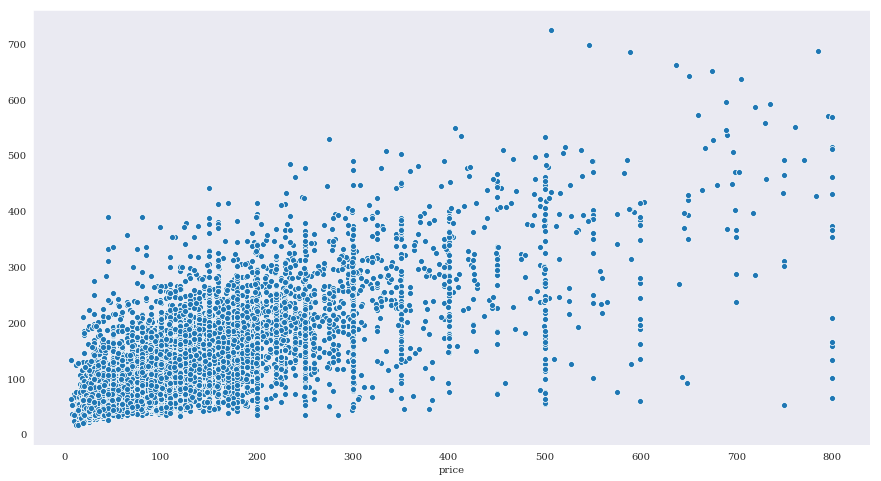

In [34]:
# Visualizing difference in predictions:
sns.scatterplot(x=y_test, y=y_pred, palette='rocket')
plt.show()

Let us also try to understand *co-efficient importance*, as in the list of top features whose fluctuation would heavily impact `price`, when rest features are kept fixed.

In [22]:
coefs_df = pd.DataFrame()

coefs_df['Impacting Features'] = X.columns
coefs_df['Coefs'] = regr.feature_importances_
coefs_df.sort_values('Coefs', ascending=False).head(10)

,Impacting Features,Coefs
14,bedrooms,0.283515
13,bathrooms,0.105798
9,cleaning_fee,0.091530
8,security_deposit,0.063235
11,host_total_listings_count,0.048683
10,host_listings_count,0.047193
16,number_of_reviews,0.028911
12,minimum_nights,0.028118
15,guests_included,0.019952
17,review_scores_rating,0.018285


In [23]:
print(f'Root mean squared error (RMSE): {np.sqrt(mean_squared_error(y_test, y_pred)):.2f}.')

Root mean squared error (RMSE): 60.18.


### Data Modelling (LightGBM):

**Light GBM** grows tree vertically while other algorithms grow trees horizontally, so Light GBM grows tree *leaf-wise* while other algorithms grow *level-wise*. It will choose the leaf with max *delta loss* to grow. When growing the same leaf, Leaf-wise algorithm can reduce more loss than a level-wise algorithm. Hence giving it a shot!

In [24]:
fit_param = {'early_stopping_rounds': 25, 'eval_metric': 'rmse', 'eval_set': [(X_test, y_test)], 'eval_names': ['Deduced'], 
            'verbose': 100, 'feature_name': 'auto', 'categorical_feature': 'auto'}

class LGBMRegressor_GainFE(LGBMRegressor):
    @property
    def feature_importances_(self):
        if self._n_features is None:
            raise LGBMNotFittedError('No feature_importances found. Need to call fit beforehand.')
        return self.booster_.feature_importance(importance_type='gain')

In [25]:
regr_gbm = LGBMRegressor_GainFE(num_leaves= 25, max_depth=20, random_state= 42, silent=True, metric= 'rmse', n_jobs= -1, 
                                n_estimators=1500, colsample_bytree=0.9, subsample=0.9, learning_rate=0.001)

In [26]:
regr_gbm.fit(X_train, y_train, **fit_param)

Training until validation scores don't improve for 25 rounds.
[100]	Deduced's rmse: 89.4214
[200]	Deduced's rmse: 85.6548
[300]	Deduced's rmse: 82.3775
[400]	Deduced's rmse: 79.5224
[500]	Deduced's rmse: 77.075
[600]	Deduced's rmse: 74.9617
[700]	Deduced's rmse: 73.1626
[800]	Deduced's rmse: 71.6262
[900]	Deduced's rmse: 70.2964
[1000]	Deduced's rmse: 69.1528
[1100]	Deduced's rmse: 68.1618
[1200]	Deduced's rmse: 67.3044
[1300]	Deduced's rmse: 66.5725
[1400]	Deduced's rmse: 65.9334
[1500]	Deduced's rmse: 65.381
Did not meet early stopping. Best iteration is:
[1500]	Deduced's rmse: 65.381


LGBMRegressor_GainFE(boosting_type='gbdt', class_weight=None,
           colsample_bytree=0.9, importance_type='split',
           learning_rate=0.001, max_depth=20, metric='rmse',
           min_child_samples=20, min_child_weight=0.001,
           min_split_gain=0.0, n_estimators=1500, n_jobs=-1, num_leaves=25,
           objective=None, random_state=42, reg_alpha=0.0, reg_lambda=0.0,
           silent=True, subsample=0.9, subsample_for_bin=200000,
           subsample_freq=0)

In [27]:
y_pred_lgbm= regr_gbm.predict(X_test)
print(f'Root mean squared error (RMSE): {np.sqrt(mean_squared_error(y_test, y_pred_lgbm)):.2f}.\n')

Root mean squared error (RMSE): 65.38.



Quick overview of Feature Importance:

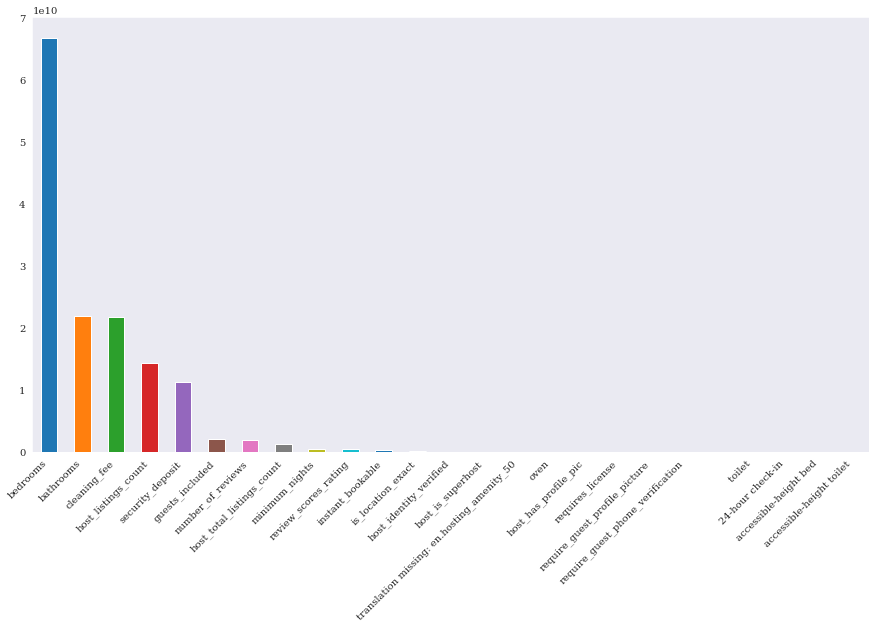

In [35]:
feat = pd.Series(regr_gbm.feature_importances_, index=X.columns)
feat.nlargest(25).plot(kind='bar')
ax = plt.gca()
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
plt.show()

### Data Modelling (ANN):

In [29]:
# Defining our base model:
def baseline_model():
    model = Sequential()
    model.add(Dense(212, input_dim=212, activation='relu'))
    model.add(Dense(212, activation='relu'))
    model.add(Dense(1, activation='linear'))
    model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mae'])
    return model

In [30]:
# evaluate model with standardized dataset
np.random.seed(42)
regr_keras = []
regr_keras.append(('standardize', StandardScaler()))
regr_keras.append(('mlp', KerasRegressor(build_fn=baseline_model, epochs=100, batch_size=5000, verbose=1)))
pipeline = Pipeline(regr_keras)

pipeline.fit(X_train, y_train)
y_pred_keras = pipeline.predict(X_test)

Epoch 1/100
61995/61995 [==============================] - 1s 13us/step - loss: 19197.5380 - mean_absolute_error: 101.9180
Epoch 2/100
61995/61995 [==============================] - 1s 9us/step - loss: 16506.9178 - mean_absolute_error: 88.8788
Epoch 3/100
61995/61995 [==============================] - 1s 9us/step - loss: 12136.4088 - mean_absolute_error: 68.6991
Epoch 4/100
61995/61995 [==============================] - 1s 9us/step - loss: 7910.0824 - mean_absolute_error: 55.4338
Epoch 5/100
61995/61995 [==============================] - 1s 10us/step - loss: 6712.9391 - mean_absolute_error: 56.8723
Epoch 6/100
61995/61995 [==============================] - 1s 9us/step - loss: 6111.2588 - mean_absolute_error: 51.3838
Epoch 7/100
61995/61995 [==============================] - 1s 9us/step - loss: 5813.3297 - mean_absolute_error: 48.4872
Epoch 8/100
61995/61995 [==============================] - 1s 9us/step - loss: 5620.9830 - mean_absolute_error: 48.0314
Epoch 9/100
61995/61995 [=========

In [31]:
# Checking inputs and predicted outputs:
for i in range(len(X_test)):
    print(f'X= {X_test[i]}, Predicted={y_pred_keras[i]}')

X= [-4.11618925e-01 -7.71717272e-01  5.28994950e-02 -1.29907878e+00
  0.00000000e+00 -8.12934260e-01 -1.09686287e-01 -1.35948560e-01
 -2.40800881e-01 -7.43752105e-01 -1.75092020e-01 -1.75092020e-01
  1.06749740e-03 -4.71777366e-01 -4.37243650e-01 -4.36479529e-01
 -4.17186929e-01  7.58326649e-01 -7.10058172e-02 -1.00507875e-01
 -2.95252132e-01 -1.45486082e-01 -1.24548720e-01 -2.49242887e-01
 -1.06266214e-02 -5.67993899e-03 -2.44372407e-02 -9.03522596e-02
 -6.10228792e-02 -1.34898646e-01 -3.63928445e-02 -7.88436522e-02
 -7.89471549e-02 -2.85619562e-01 -3.54929705e-02 -1.63597898e-01
 -3.40988909e-02 -6.95653226e-03 -1.55567848e-02 -6.41115964e-01
 -7.89471549e-02 -1.20496505e-02 -7.87400169e-02 -4.14081060e-01
 -4.29213886e-02 -1.62973154e-01  2.42375415e+00 -4.50339293e-01
  9.08823514e-01 -1.55735798e-01 -1.65617293e-02 -8.98098940e-03
 -5.67993899e-03 -8.52210320e-02 -2.05798975e-01 -1.36378697e-01
 -1.39655619e-01 -4.07052877e-01 -3.74874793e-02 -5.82844976e-01
 -2.07961033e-01 -2.27

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



X= [-4.11618925e-01 -7.71717272e-01  5.28994950e-02 -1.29907878e+00
  0.00000000e+00  1.23011177e+00 -1.09686287e-01 -1.35948560e-01
 -4.86944612e-01 -7.43752105e-01 -1.75092020e-01 -1.75092020e-01
  1.06749740e-03 -4.71777366e-01 -4.37243650e-01 -4.36479529e-01
 -4.77183435e-01 -1.64450757e+00 -7.10058172e-02 -1.00507875e-01
 -2.95252132e-01 -1.45486082e-01 -1.24548720e-01 -2.49242887e-01
 -1.06266214e-02 -5.67993899e-03 -2.44372407e-02 -9.03522596e-02
 -6.10228792e-02 -1.34898646e-01 -3.63928445e-02 -7.88436522e-02
 -7.89471549e-02 -2.85619562e-01 -3.54929705e-02 -1.63597898e-01
 -3.40988909e-02 -6.95653226e-03 -1.55567848e-02  1.55978022e+00
 -7.89471549e-02 -1.20496505e-02 -7.87400169e-02 -4.14081060e-01
 -4.29213886e-02 -1.62973154e-01 -4.12583100e-01 -4.50339293e-01
 -1.10032364e+00 -1.55735798e-01 -1.65617293e-02 -8.98098940e-03
 -5.67993899e-03 -8.52210320e-02 -2.05798975e-01 -1.36378697e-01
 -1.39655619e-01 -4.07052877e-01 -3.74874793e-02 -5.82844976e-01
 -2.07961033e-01 -2.27

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




X= [-0.41161893 -0.77171727  0.0528995   0.76977626  0.         -0.81293426
 -0.10968629 -0.13594856  1.38753457  2.99169476  0.81848449  0.81848449
 -0.06758344 -0.47177737  0.66636844 -0.43647953 -0.47718343 -1.64450757
 -0.07100582 -0.10050788 -0.29525213 -0.14548608 -0.12454872 -0.24924289
 -0.01062662 -0.00567994 -0.02443724 -0.09035226 -0.06102288 -0.13489865
 -0.03639284 -0.07884365 -0.07894715 -0.28561956 -0.03549297 -0.1635979
 -0.03409889 -0.00695653 -0.01555678  1.55978022 -0.07894715 -0.01204965
 -0.07874002 -0.41408106 -0.04292139 -0.16297315 -0.4125831  -0.45033929
  0.90882351 -0.1557358  -0.01656173 -0.00898099 -0.00567994 -0.08522103
 -0.20579897 -0.1363787  -0.13965562 -0.40705288 -0.03748748 -0.58284498
 -0.20796103 -0.02272526 -0.09152436  1.65401445 -0.46472542 -0.11266031
 -0.14073224 -0.03264562 -0.89913078 -0.0323971  -0.01448234  1.80812999
 -0.04654188 -0.04891832  0.27966304 -0.18460028 -0.06902836 -0.01555678
 -0.4053282  -0.73772524 -0.01204965 -0.6645375 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




X= [-4.11618925e-01  1.29581135e+00  5.28994950e-02  7.69776258e-01
  0.00000000e+00 -8.12934260e-01 -1.09686287e-01 -1.35948560e-01
 -4.86944612e-01 -2.45692523e-01 -1.68681849e-01 -1.68681849e-01
  6.97184327e-02 -4.71777366e-01 -4.37243650e-01 -4.36479529e-01
 -4.17186929e-01  7.58326649e-01 -7.10058172e-02 -1.00507875e-01
 -2.95252132e-01  6.87350974e+00 -1.24548720e-01 -2.49242887e-01
 -1.06266214e-02 -5.67993899e-03 -2.44372407e-02 -9.03522596e-02
 -6.10228792e-02  7.41297282e+00 -3.63928445e-02 -7.88436522e-02
 -7.89471549e-02  3.50116075e+00 -3.54929705e-02 -1.63597898e-01
 -3.40988909e-02 -6.95653226e-03 -1.55567848e-02 -6.41115964e-01
 -7.89471549e-02 -1.20496505e-02 -7.87400169e-02 -4.14081060e-01
 -4.29213886e-02 -1.62973154e-01 -4.12583100e-01 -4.50339293e-01
  9.08823514e-01 -1.55735798e-01 -1.65617293e-02 -8.98098940e-03
 -5.67993899e-03 -8.52210320e-02  4.85911069e+00  7.33252351e+00
 -1.39655619e-01 -4.07052877e-01 -3.74874793e-02  1.71572209e+00
  4.80859315e+00 -2.2

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




X= [ 2.42943154  1.29581135  0.0528995  -1.29907878  0.         -0.81293426
 -0.10968629 -0.13594856 -0.48694461  0.25236706 -0.16868185 -0.16868185
  0.06971843  1.21597114 -0.43724365 -0.43647953  1.17272047  0.71026996
 -0.07100582 -0.10050788 -0.29525213 -0.14548608 -0.12454872 -0.24924289
 -0.01062662 -0.00567994 -0.02443724 -0.09035226 -0.06102288 -0.13489865
 -0.03639284 -0.07884365 -0.07894715 -0.28561956 -0.03549297 -0.1635979
 -0.03409889 -0.00695653 -0.01555678 -0.64111596 -0.07894715 -0.01204965
 -0.07874002 -0.41408106 -0.04292139 -0.16297315  2.42375415 -0.45033929
  0.90882351 -0.1557358  -0.01656173 -0.00898099 -0.00567994 -0.08522103
 -0.20579897 -0.1363787  -0.13965562 -0.40705288 -0.03748748 -0.58284498
 -0.20796103 -0.02272526 -0.09152436 -0.60458964 -0.46472542 -0.11266031
 -0.14073224 -0.03264562 -0.89913078 -0.0323971  -0.01448234  1.80812999
 -0.04654188 -0.04891832  0.27966304 -0.18460028 -0.06902836 -0.01555678
 -0.4053282  -0.73772524 -0.01204965 -0.6645375 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



X= [-0.41161893 -0.77171727  0.0528995  -1.29907878  0.         -0.81293426
 -0.10968629 -0.13594856  0.45976204 -0.74375211  0.53643696  0.53643696
  0.2070203  -0.47177737 -0.43724365 -0.43647953 -0.44718518  0.27775981
 -0.07100582 -0.10050788 -0.29525213 -0.14548608 -0.12454872 -0.24924289
 -0.01062662 -0.00567994 -0.02443724 -0.09035226 -0.06102288 -0.13489865
 -0.03639284 -0.07884365 -0.07894715 -0.28561956 -0.03549297 -0.1635979
 -0.03409889 -0.00695653 -0.01555678 -0.64111596 -0.07894715 -0.01204965
 -0.07874002  2.41498609 -0.04292139 -0.16297315 -0.4125831  -0.45033929
 -1.10032364 -0.1557358  -0.01656173 -0.00898099 -0.00567994 -0.08522103
 -0.20579897 -0.1363787  -0.13965562  2.45668329 -0.03748748  1.71572209
 -0.20796103 -0.02272526 -0.09152436  1.65401445  2.15180827 -0.11266031
 -0.14073224 -0.03264562 -0.89913078 -0.0323971  -0.01448234 -0.55305758
 -0.04654188 -0.04891832  0.27966304 -0.18460028 -0.06902836 -0.01555678
 -0.4053282   1.35551821 -0.01204965 -0.6645375  

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



X= [-4.11618925e-01 -7.71717272e-01  5.28994950e-02 -1.29907878e+00
  0.00000000e+00  1.23011177e+00 -1.09686287e-01 -1.35948560e-01
 -4.86944612e-01 -7.43752105e-01 -1.55861507e-01 -1.55861507e-01
 -2.04885308e-01 -4.71777366e-01 -4.37243650e-01 -4.36479529e-01
 -4.77183435e-01 -1.64450757e+00 -7.10058172e-02 -1.00507875e-01
 -2.95252132e-01 -1.45486082e-01 -1.24548720e-01 -2.49242887e-01
 -1.06266214e-02 -5.67993899e-03 -2.44372407e-02 -9.03522596e-02
 -6.10228792e-02 -1.34898646e-01 -3.63928445e-02 -7.88436522e-02
 -7.89471549e-02 -2.85619562e-01 -3.54929705e-02 -1.63597898e-01
 -3.40988909e-02 -6.95653226e-03 -1.55567848e-02 -6.41115964e-01
 -7.89471549e-02 -1.20496505e-02 -7.87400169e-02 -4.14081060e-01
 -4.29213886e-02 -1.62973154e-01 -4.12583100e-01 -4.50339293e-01
 -1.10032364e+00 -1.55735798e-01 -1.65617293e-02 -8.98098940e-03
 -5.67993899e-03 -8.52210320e-02 -2.05798975e-01 -1.36378697e-01
 -1.39655619e-01 -4.07052877e-01 -3.74874793e-02 -5.82844976e-01
 -2.07961033e-01 -2.27

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



X= [-4.11618925e-01 -7.71717272e-01  5.28994950e-02 -1.29907878e+00
  0.00000000e+00  1.23011177e+00 -1.09686287e-01 -1.35948560e-01
 -4.86944612e-01  2.27464080e-01 -1.55861507e-01 -1.55861507e-01
 -1.36234373e-01 -4.71777366e-01 -4.37243650e-01 -4.36479529e-01
  6.27851166e-02  4.94014885e-01 -7.10058172e-02 -1.00507875e-01
 -2.95252132e-01 -1.45486082e-01 -1.24548720e-01 -2.49242887e-01
 -1.06266214e-02 -5.67993899e-03 -2.44372407e-02 -9.03522596e-02
 -6.10228792e-02 -1.34898646e-01 -3.63928445e-02 -7.88436522e-02
 -7.89471549e-02 -2.85619562e-01 -3.54929705e-02 -1.63597898e-01
 -3.40988909e-02 -6.95653226e-03 -1.55567848e-02 -6.41115964e-01
 -7.89471549e-02 -1.20496505e-02 -7.87400169e-02 -4.14081060e-01
 -4.29213886e-02 -1.62973154e-01 -4.12583100e-01 -4.50339293e-01
  9.08823514e-01 -1.55735798e-01 -1.65617293e-02 -8.98098940e-03
 -5.67993899e-03 -8.52210320e-02 -2.05798975e-01 -1.36378697e-01
 -1.39655619e-01 -4.07052877e-01 -3.74874793e-02  1.71572209e+00
 -2.07961033e-01 -2.27

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



X= [-0.41161893 -0.77171727  0.0528995   0.76977626  0.         -0.81293426
 -0.10968629 -0.13594856 -0.16506435  1.34809814 -0.17509202 -0.17509202
 -0.13623437  1.21597114  0.66636844  0.36234991 -0.41718693  0.75832665
 -0.07100582 -0.10050788 -0.29525213 -0.14548608 -0.12454872 -0.24924289
 -0.01062662 -0.00567994 -0.02443724 -0.09035226 -0.06102288 -0.13489865
 -0.03639284 -0.07884365 -0.07894715 -0.28561956 -0.03549297 -0.1635979
 -0.03409889 -0.00695653 -0.01555678 -0.64111596 -0.07894715 -0.01204965
 -0.07874002 -0.41408106 -0.04292139 -0.16297315 -0.4125831  -0.45033929
  0.90882351 -0.1557358  -0.01656173 -0.00898099 -0.00567994 -0.08522103
 -0.20579897 -0.1363787  -0.13965562 -0.40705288 -0.03748748 -0.58284498
 -0.20796103 -0.02272526 -0.09152436 -0.60458964 -0.46472542 -0.11266031
 -0.14073224 -0.03264562  1.11218526 -0.0323971  -0.01448234  1.80812999
 -0.04654188 -0.04891832  0.27966304 -0.18460028 -0.06902836 -0.01555678
 -0.4053282  -0.73772524 -0.01204965 -0.6645375  

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



X= [-4.11618925e-01  1.29581135e+00  5.28994950e-02  7.69776258e-01
  0.00000000e+00 -8.12934260e-01 -1.09686287e-01 -1.35948560e-01
 -1.08261949e-01 -7.43752105e-01 -1.55861507e-01 -1.55861507e-01
 -1.36234373e-01  1.21597114e+00 -4.37243650e-01 -4.36479529e-01
  2.12776381e-01  7.10269965e-01 -7.10058172e-02 -1.00507875e-01
 -2.95252132e-01 -1.45486082e-01 -1.24548720e-01 -2.49242887e-01
 -1.06266214e-02 -5.67993899e-03 -2.44372407e-02 -9.03522596e-02
 -6.10228792e-02 -1.34898646e-01 -3.63928445e-02 -7.88436522e-02
 -7.89471549e-02 -2.85619562e-01 -3.54929705e-02 -1.63597898e-01
 -3.40988909e-02 -6.95653226e-03 -1.55567848e-02 -6.41115964e-01
 -7.89471549e-02 -1.20496505e-02 -7.87400169e-02 -4.14081060e-01
 -4.29213886e-02 -1.62973154e-01 -4.12583100e-01 -4.50339293e-01
 -1.10032364e+00  6.42113124e+00 -1.65617293e-02 -8.98098940e-03
 -5.67993899e-03 -8.52210320e-02 -2.05798975e-01 -1.36378697e-01
 -1.39655619e-01 -4.07052877e-01 -3.74874793e-02 -5.82844976e-01
 -2.07961033e-01 -2.27

In [32]:
print(f'Root mean squared error (RMSE): {np.sqrt(mean_squared_error(y_test, y_pred_keras)):.2f}.\n')

Root mean squared error (RMSE): 68.33.

